# Esther Phase 2

In [0]:
from pyspark.sql.functions import col

import matplotlib.pyplot as plt
from pyspark.sql import functions as f
from pyspark.sql.functions import isnull, when, count
from pyspark.sql.functions import *
from pyspark.sql import SQLContext
from pyspark.sql.types import *
import pyspark
import pandas as pd
import numpy as np

import seaborn as sns


In [0]:
# Inspect the Mount's Final Project folder 
display(dbutils.fs.ls("/mnt/mids-w261/datasets_final_project"))

path,name,size
dbfs:/mnt/mids-w261/datasets_final_project/airlines/,airlines/,0
dbfs:/mnt/mids-w261/datasets_final_project/airlines_data/,airlines_data/,0
dbfs:/mnt/mids-w261/datasets_final_project/parquet_airlines_data/,parquet_airlines_data/,0
dbfs:/mnt/mids-w261/datasets_final_project/parquet_airlines_data_3m/,parquet_airlines_data_3m/,0
dbfs:/mnt/mids-w261/datasets_final_project/parquet_airlines_data_6m/,parquet_airlines_data_6m/,0
dbfs:/mnt/mids-w261/datasets_final_project/stations_data/,stations_data/,0
dbfs:/mnt/mids-w261/datasets_final_project/weather_data/,weather_data/,0
dbfs:/mnt/mids-w261/datasets_final_project/weather_data_6_hr/,weather_data_6_hr/,0
dbfs:/mnt/mids-w261/datasets_final_project/weather_data_single/,weather_data_single/,0


#Datasets

##Flight Table

In [0]:
# Flight Table
# Load all Flights (2015 - 2019)
df_airlines = spark.read.parquet("/mnt/mids-w261/datasets_final_project/parquet_airlines_data/*")
display(df_airlines)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_AIRPORT,DIV2_AIRPORT_ID,DIV2_AIRPORT_SEQ_ID,DIV2_WHEELS_ON,DIV2_TOTAL_GTIME,DIV2_LONGEST_GTIME,DIV2_WHEELS_OFF,DIV2_TAIL_NUM,DIV3_AIRPORT,DIV3_AIRPORT_ID,DIV3_AIRPORT_SEQ_ID,DIV3_WHEELS_ON,DIV3_TOTAL_GTIME,DIV3_LONGEST_GTIME,DIV3_WHEELS_OFF,DIV3_TAIL_NUM,DIV4_AIRPORT,DIV4_AIRPORT_ID,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_AIRPORT_SEQ_ID,DIV5_WHEELS_ON,DIV5_TOTAL_GTIME,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF,DIV5_TAIL_NUM
2019,3,7,31,3,2019-07-31,WN,19393,WN,N908WN,555,10693,1069302,30693,BNA,"Nashville, TN",TN,47,Tennessee,54,13487,1348702,31650,MSP,"Minneapolis, MN",MN,27,Minnesota,63,1045,1058,13.0,13.0,0.0,0,1000-1059,10.0,1108,1254,4.0,1255,1258,3.0,3.0,0.0,0,1200-1259,0.0,null,0.0,130.0,120.0,106.0,1.0,695.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2019,3,7,31,3,2019-07-31,WN,19393,WN,N415WN,2300,10693,1069302,30693,BNA,"Nashville, TN",TN,47,Tennessee,54,13487,1348702,31650,MSP,"Minneapolis, MN",MN,27,Minnesota,63,1815,1813,-2.0,0.0,0.0,-1,1800-1859,9.0,1822,2006,11.0,2020,2017,-3.0,0.0,0.0,-1,2000-2059,0.0,null,0.0,125.0,124.0,104.0,1.0,695.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2019,3,7,31,3,2019-07-31,WN,19393,WN,N966WN,443,10693,1069302,30693,BNA,"Nashville, TN",TN,47,Tennessee,54,13495,1349505,33495,MSY,"New Orleans, LA",LA,22,Louisiana,72,1945,1953,8.0,8.0,0.0,0,1900-1959,12.0,2005,2110,2.0,2105,2112,7.0,7.0,0.0,0,2100-2159,0.0,null,0.0,80.0,79.0,65.0,1.0,471.0,2,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2019,3,7,31,3,2019-07-31,WN,19393,WN,N403WN,1371,10693,1069302,30693,BNA,"Nashville, TN",TN,47,Tennessee,54,13495,1349505,33495,MSY,"New Orleans, LA",LA,22,Louisiana,72,1330,1337,7.0,7.0,0.0,0,1300-1359,9.0,1346,1451,4.0,1505,1455,-10.0,0.0,0.0,-1,1500-1559,0.0,null,0.0,95.0,78.0,65.0,1.0,471.0,2,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2019,3,7,31,3,2019-07-31,WN,19393,WN,N423WN,2483,10693,1069302,30693,BNA,"Nashville, TN",TN,47,Tennessee,54,13495,1349505,33495,MSY,"New Orleans, LA",LA,22,Louisian

In [0]:
df_airlines.createOrReplaceTempView("flights")

##Weather Table

In [0]:
# Load the 2015 Q1 for Weather
df_weather = spark.read.parquet("/mnt/mids-w261/datasets_final_project/weather_data/*").filter(col('DATE') < "2015-04-01T00:00:00.000")
display(df_weather)

STATION,DATE,SOURCE,LATITUDE,LONGITUDE,ELEVATION,NAME,REPORT_TYPE,CALL_SIGN,QUALITY_CONTROL,WND,CIG,VIS,TMP,DEW,SLP,AW1,GA1,GA2,GA3,GA4,GE1,GF1,KA1,KA2,MA1,MD1,MW1,MW2,OC1,OD1,OD2,REM,EQD,AW2,AX4,GD1,AW5,GN1,AJ1,AW3,MK1,KA4,GG3,AN1,RH1,AU5,HL1,OB1,AT8,AW7,AZ1,CH1,RH3,GK1,IB1,AX1,CT1,AK1,CN2,OE1,MW5,AO1,KA3,AA3,CR1,CF2,KB2,GM1,AT5,AY2,MW6,MG1,AH6,AU2,GD2,AW4,MF1,AA1,AH2,AH3,OE3,AT6,AL2,AL3,AX5,IB2,AI3,CV3,WA1,GH1,KF1,CU2,CT3,SA1,AU1,KD2,AI5,GO1,GD3,CG3,AI1,AL1,AW6,MW4,AX6,CV1,ME1,KC2,CN1,UA1,GD5,UG2,AT3,AT4,GJ1,MV1,GA5,CT2,CG2,ED1,AE1,CO1,KE1,KB1,AI4,MW3,KG2,AA2,AX2,AY1,RH2,OE2,CU3,MH1,AM1,AU4,GA6,KG1,AU3,AT7,KD1,GL1,IA1,GG2,OD3,UG1,CB1,AI6,CI1,CV2,AZ2,AD1,AH1,WD1,AA4,KC1,IA2,CF3,AI2,AT1,GD4,AX3,AH4,KB3,CU1,CN4,AT2,CG1,CF1,GG1,MV2,CW1,GG4,AB1,AH5,CN3
3809099999,2015-01-01T00:00:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-12,99999,V020,"200,1,N,0077,1","00240,1,C,N","008000,1,9,9","+0113,1","+0099,1","10306,1",,"01,1,+00180,1,07,1","05,1,+00240,1,07,1","08,1,+00360,1,07,1",,"9,AGL ,+99999,+99999","08,99,1,01,1,99,9,00180,1,99,9,99,9",,,"99999,9,10213,1","3,1,002,1,+999,9","51,1",,,"3,99,0144,1,999","4,99,0134,1,999",SYN10603809 11358 82015 10113 20099 30213 40306 53002 69901 75165 887// 333 81706 85708 88712 90710 91128 91026=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"5,1,02,1",,,,,,,,"06,0000,2,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"6,1,02,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3809099999,2015-01-01T00:50:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-15,99999,V020,"210,1,N,0077,1","00183,1,C,N","008000,1,9,9","+0110,1","+0100,1","99999,9",,"02,1,+00122,1,99,9","04,1,+00183,1,99,9","08,1,+00305,1,99,9",,"9,AGL ,+99999,+99999","99,99,9,02,1,99,9,00122,1,99,9,99,9",,,"10290,1,99999,9",,"51,1",,,,,MET079METAR EGDR 010050Z 21015KT 8000 -DZ FEW004 SCT006 OVC010 11/10 Q1029 YLO1=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3809099999,2015-01-01T01:00:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-12,99999,V020,"210,1,N,0077,1","00300,1,9,N","008000,1,9,9","+0113,1","+0101,1","10300,1",,"01,1,+00120,1,07,1","03,1,+00180,1,07,1","08,1,+00300,1,07,1",,"9,AGL ,+99999,+99999","08,99,1,01,1,99,9,00120,1,99,9,99,9",,,"99999,9,10206,1","8,1,004,1,+999,9","51,1",,,"3,99,0134,1,999",,SYN09403809 41258 82115 10113 20101 30206 40300 58004 75155 887// 333 81704 83706 88710 90710 91126=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"5,1,02,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"5,1,02,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3809099999,2015-01-01T01:50:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-15,99999,V020,"200,1,N,0082,1","00244,1,9,N","008000,1,9,9","+0120,1","+0100,1","99999,9",,"04,1,+00183,1,99,9","07,1,+00244,1,99,9","08,1,+00305,1,99,9",,"9,AGL ,+99999,+99999","99,99,9,04,1,99,9,00183,1,99,9,99,9",,,"10290,1,99999,9",,"05,1",,"0144,1",,,MET086METAR EGDR 010150Z 20016G28KT 8000 HZ SCT006 BKN008 OVC010 12/10 Q1029 REDZ YLO1=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3809099999,2015-01-01T02:00:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-12,99999,V020,"200,1,N,0082,1","00240,1,C,N","008000,1,9,9","+0115,1","+0100,1","10294,1",,"03,1,+00180,1,07,1","05,1,+00240,1,07,1","08,1,+00300,1,07,1",,"9,AGL ,+99999,+99999","08,99,1,03,1,99,9,00180,1,99,9,99,9",,,"99999,9,10201,1","8,1,008,1,+999,9","20,1",,,"3,99,0149,1,999","4,99,0144,1,999",SYN10003809 41358 82016 10115 20100 30201 40294 58008 72052 886// 333 83706 85708 88710 90710 91129 91028=,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"2,1,02,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,"5,1,02,1",,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3809099999,2015-01-01T02:50:00.000+0000,4,50.086092,-5.255711,81.38,"CULDROSE, UK",FM-15,99999,V020,"210,1,N,0093,1","00122,1,9,N","006000,1

##Station Table

In [0]:
df_stations = spark.read.parquet("/mnt/mids-w261/datasets_final_project/stations_data/*")
display(df_stations)

usaf,wban,station_id,lat,lon,neighbor_id,neighbor_name,neighbor_state,neighbor_call,neighbor_lat,neighbor_lon,distance_to_neighbor
690020,93218,69002093218,36.0,-121.233,69002093218,JOLON HUNTER LIGGETT MIL RES,CA,KHGT,36.0,-121.233,0.0
690020,93218,69002093218,36.0,-121.233,69007093217,FRITZSCHE AAF,CA,KOAR,36.683,-121.767,55.73024537916726
690020,93218,69002093218,36.0,-121.233,69014093101,EL TORO MCAS,CA,KNZJ,33.667,-117.733,255.49106220353934
690020,93218,69002093218,36.0,-121.233,70027127506,BARROW POINT BARROW,AK,KPBA,71.333,-156.65,2750.4353299559803
690020,93218,69002093218,36.0,-121.233,70045027512,LONELY,AK,LNI,70.917,-153.25,2676.3554370627153
690020,93218,69002093218,36.0,-121.233,70063027403,OLIKTOK POW 2,AK,POLI,70.5,-149.883,2604.050248854232
690020,93218,69002093218,36.0,-121.233,70063526465,GALBRAITH LAKE AIRPORT,AK,PAGB,68.479,-149.49,2490.9756094472277
690020,93218,69002093218,36.0,-121.233,70063627405,PRUDHOE BAY,AK,PAUD,70.25,-148.333,2568.180281844432
690020,93218,69002093218,36.0,-121.233,70104626418,CENTRAL AIRPORT,AK,PACE,65.567,-144.765,2254.5584891291946
690020,93218,69002093218,36.0,-121.233,70119526625,SHISHMAREF/NEW AIRPORT,AK,PASH,66.25,-166.089,2743.6881828292408


##OpenFlight Table

In [0]:
# Import Open Flight Data, which contains IATA code and ICAO code. These 2 codes can be used to join tables 

open_flight_data = pd.read_csv('https://raw.githubusercontent.com/jpatokal/openflights/master/data/airports.dat', header=None)
open_flight_schema = {
    0: 'AirportID', 1: 'Name', 2: 'City', 3: 'Country', 4: 'IATA', 5: 'ICAO', 6: 'Latitude', 
    7: 'Longitude', 8: 'Altitude', 9: 'Timezone', 10: 'DST', 11: 'TZ_Timezone', 12: 'Type', 13: 'Source'
}
open_flight_data.rename(columns=open_flight_schema, inplace=True)
airport_code = spark.createDataFrame(open_flight_data)
display(airport_code)
airport_code.createOrReplaceTempView("airport_code")

AirportID,Name,City,Country,IATA,ICAO,Latitude,Longitude,Altitude,Timezone,DST,TZ_Timezone,Type,Source
1,Goroka Airport,Goroka,Papua New Guinea,GKA,AYGA,-6.081689834590001,145.391998291,5282,10,U,Pacific/Port_Moresby,airport,OurAirports
2,Madang Airport,Madang,Papua New Guinea,MAG,AYMD,-5.20707988739,145.789001465,20,10,U,Pacific/Port_Moresby,airport,OurAirports
3,Mount Hagen Kagamuga Airport,Mount Hagen,Papua New Guinea,HGU,AYMH,-5.826789855957031,144.29600524902344,5388,10,U,Pacific/Port_Moresby,airport,OurAirports
4,Nadzab Airport,Nadzab,Papua New Guinea,LAE,AYNZ,-6.569803,146.725977,239,10,U,Pacific/Port_Moresby,airport,OurAirports
5,Port Moresby Jacksons International Airport,Port Moresby,Papua New Guinea,POM,AYPY,-9.44338035583496,147.22000122070312,146,10,U,Pacific/Port_Moresby,airport,OurAirports
6,Wewak International Airport,Wewak,Papua New Guinea,WWK,AYWK,-3.58383011818,143.669006348,19,10,U,Pacific/Port_Moresby,airport,OurAirports
7,Narsarsuaq Airport,Narssarssuaq,Greenland,UAK,BGBW,61.1604995728,-45.4259986877,112,-3,E,America/Godthab,airport,OurAirports
8,Godthaab / Nuuk Airport,Godthaab,Greenland,GOH,BGGH,64.19090271,-51.6781005859,283,-3,E,America/Godthab,airport,OurAirports
9,Kangerlussuaq Airport,Sondrestrom,Greenland,SFJ,BGSF,67.0122218992,-50.7116031647,165,-3,E,America/Godthab,airport,OurAirports
10,Thule Air Base,Thule,Greenland,THU,BGTL,76.5311965942,-68.7032012939,251,-4,E,America/Thule,airport,OurAirports


#EDA

##Flight (2015 - 2019)

### Check for Duplicates

In [0]:
df_airlines_without_duplicates = df_airlines.dropDuplicates()
duplicate_count = df_airlines.count() - df_airlines_without_duplicates.count()
print(f'Total records in Flight Table: {df_airlines.count()}')
print(f'Number of duplicates in Flight Table: {duplicate_count}')
print(f'The percentage of duplicate records: {duplicate_count / df_airlines.count() * 100:.2f} %')

Total records in Flight Table: 63493682
Number of duplicates in Flight Table: 31746841
The percentage of duplicate records: 50.00 %

NOTES: we found the raw flight dataset contains a total record count of 63493682 records but it seems that this dataset has duplicated records and the total records count after dropping duplicates is 31746841 which is 50% of the total records.

### Data Explore

In [0]:
total_flight = df_airlines.count()
delayed_flight = df_airlines.filter(df_airlines.DEP_DEL15 == 1).cache()
on_time_flight = df_airlines.filter(df_airlines.DEP_DEL15 == 0).cache()
cancelled_flight = df_airlines.filter(df_airlines.CANCELLED == 1).cache()
delayed_null_flight = df_airlines.filter(df_airlines.DEP_DEL15.isNull()).cache()

print(f'Total Flight: {total_flight}')
print(f'Total Flight delayed by 15 minutes or more: {delayed_flight.count()}')
print(f'The percentage of delayed flight: {delayed_flight.count() / total_flight }')
print(f'The percentage of on-time flight: {on_time_flight.count() / total_flight }')
print(f'The percentage of cancelled flight: {cancelled_flight.count() / total_flight}')
print(f'The percentage of delayed(null) flight: {delayed_null_flight.count() / total_flight}')

Total Flight: 63493682
Total Flight delayed by 15 minutes or more: 11387082
The percentage of delayed flight: 0.17934196980417674
The percentage of on-time flight: 0.8056235894462697
The percentage of cancelled flight: 0.015432937091284137
The percentage of delayed(null) flight: 0.015034440749553632

#### Cancelled Flights

In [0]:
cancelled_flight = df_airlines.filter(df_airlines.CANCELLED == 1).cache()
print(f'The percentage of cancelled flight: {cancelled_flight.count() / total_flight * 100:.2f} %')

The percentage of cancelled flight: 1.54 %

After checking the documentation of flight dataset, we found that cancelled flights can be due to the following reasons: Carrier, Weather, National Air System or Security. There are 1.5% flights that have been cancelled and there are 1.5% records have the DEP_DEL15 as NULL, which means that these records having NULL as DEP_DEL15 are the cancelled flights. Since the percentage of cancelled flight is relatively small and DEP_DEL15 is our target variable, we dicided to take out these records from our flight table.

#### Diverted Flights

In [0]:
# Diverted Flight Indicator (1=Yes)
diverted_flights = df_airlines.where(col("DIVERTED") == 1)
print(f'The percentage of diverted flight: {diverted_flights.count() / total_flight * 100:.2f} %')

The percentage of diverted flight: 0.25 %

From the documentation of flight dataset, we can know that a diverted flight is  a flight that is required to land at a destination other than the original scheduled destination for reasons beyond the control of the pilot/company. We decided to take out all diverted flights from our flight table since the percentage of diverted flights over total records in the table is relatively small (0.25%) and it's not relevent to our analysis.

### Distribution of Delays

Out[9]:

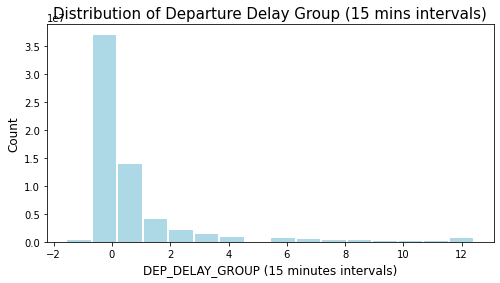

Text(0.5, 1.0, 'Distribution of Departure Delay Group (15 mins intervals)')

In [0]:
delay_groups = len(df_airlines.select("DEP_DELAY_GROUP").distinct().collect())
bar_graph = df_airlines.select("DEP_DELAY_GROUP").rdd.flatMap(lambda x: x).histogram(delay_groups)
fig, ax = plt.subplots(figsize=(8, 4))
ax.bar(x=bar_graph[0][1:], height=bar_graph[1], color='lightblue')
ax.set_xlabel('DEP_DELAY_GROUP (15 minutes intervals)', fontsize=12)
ax.set_ylabel('Count', fontsize=12)
ax.set_title("Distribution of Departure Delay Group (15 mins intervals)", fontsize=15)

### Factors that can cause flight delay

#### 1. Distance factor

In [0]:
distance_and_delay = df_airlines.select("DISTANCE_GROUP", "DEP_DELAY") \
                                .groupby("DISTANCE_GROUP") \
                                .agg(mean("DEP_DELAY"), count("DEP_DELAY")) \
                                .sort("DISTANCE_GROUP") \
                                .collect()
display(distance_and_delay)

DISTANCE_GROUP,avg(DEP_DELAY),count(DEP_DELAY)
1,8.36506969785283,7795936
2,9.219510624038211,14965590
3,9.768517858208401,12367926
4,10.266137987214483,9587410
5,11.481154238255785,6554418
6,10.094697469842226,2771922
7,10.723892842461622,2933774
8,10.431454371138797,1485288
9,10.835573596211463,1034700
10,10.382518004782977,1748702


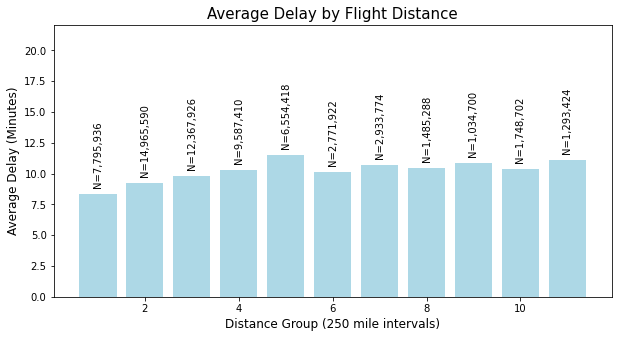

In [0]:
distance_df = pd.DataFrame(distance_and_delay, columns=["DISTANCE_GROUP", "AVG_DEP_DELAY", "COUNT_DELAY"])
fig, ax = plt.subplots(figsize=(10, 5))
ax.bar(distance_df["DISTANCE_GROUP"], height=distance_df["AVG_DEP_DELAY"], color='lightblue')
ax.set_xlabel("Distance Group (250 mile intervals)", fontsize=12)
ax.set_ylabel("Average Delay (Minutes)", fontsize=12)
ax.set_title("Average Delay by Flight Distance", fontsize=15)
for i, row in distance_df.iterrows():
    group, delay, n = row["DISTANCE_GROUP"], row["AVG_DEP_DELAY"]+0.5, f"N={row['COUNT_DELAY']:,.0f}"
    ax.text(group, delay, n, ha="center", va="bottom", rotation=90)
ax.set_ylim(0, ax.get_ylim()[1]+10)
plt.show()

#### 2. Carrier factor

In [0]:
carrier_dep_delay = df_airlines.select( 'OP_UNIQUE_CARRIER','DEP_DEL15' ).groupBy('OP_UNIQUE_CARRIER').agg(f.sum('DEP_DEL15'), count('DEP_DEL15')).withColumnRenamed('sum(DEP_DEL15)', 'Num_Departure_Delay').withColumnRenamed('count(DEP_DEL15)', 'Num_of_Flights')
carrier_dep_delay = carrier_dep_delay.withColumn("Percentage_of_Delays", round(carrier_dep_delay.Num_Departure_Delay/carrier_dep_delay.Num_of_Flights * 100, 3))
carrier_dep_delay = carrier_dep_delay.toPandas()
carrier_dep_delay_sort = carrier_dep_delay.sort_values(by='Percentage_of_Delays', ascending=False)
airline_carriers_top10 = carrier_dep_delay_sort.head(10)
display(airline_carriers_top10)

OP_UNIQUE_CARRIER,Num_Departure_Delay,Num_of_Flights,Percentage_of_Delays
B6,715052.0,2849220,25.096
F9,262658.0,1075004,24.433
VX,92484.0,434172,21.301
WN,2745880.0,13013270,21.101
NK,316940.0,1557656,20.347
G4,81036.0,400352,20.241
OH,216792.0,1099608,19.715
UA,1094186.0,5731420,19.091
YV,159602.0,862442,18.506
MQ,325174.0,1765038,18.423


Out[25]:

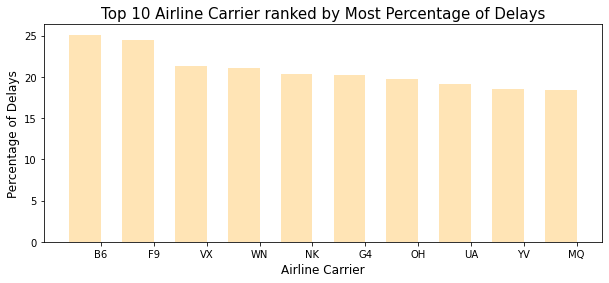

([<matplotlib.axis.XTick at 0x7f57e41a2af0>,
 <matplotlib.axis.XTick at 0x7f57e41bad60>,
 <matplotlib.axis.XTick at 0x7f57e4167430>,
 <matplotlib.axis.XTick at 0x7f57e411ce50>,
 <matplotlib.axis.XTick at 0x7f57e412a5e0>,
 <matplotlib.axis.XTick at 0x7f57e412ad30>,
 <matplotlib.axis.XTick at 0x7f57e412e4c0>,
 <matplotlib.axis.XTick at 0x7f57e412ec10>,
 <matplotlib.axis.XTick at 0x7f57e412edf0>,
 <matplotlib.axis.XTick at 0x7f57e412acd0>],
 [Text(0.3, 0, 'B6'),
 Text(1.3, 0, 'F9'),
 Text(2.3, 0, 'VX'),
 Text(3.3, 0, 'WN'),
 Text(4.3, 0, 'NK'),
 Text(5.3, 0, 'G4'),
 Text(6.3, 0, 'OH'),
 Text(7.3, 0, 'UA'),
 Text(8.3, 0, 'YV'),
 Text(9.3, 0, 'MQ')])

In [0]:
# Draw histogram for airline carriers with the most percentage of departure delays
fig = plt.figure(figsize = (10, 4))
bar_width = 0.6

number_of_carrier = np.arange(len(airline_carriers_top10['OP_UNIQUE_CARRIER'].unique()))

bar_graph_carrier = plt.bar(number_of_carrier, airline_carriers_top10['Percentage_of_Delays'],
                            width = bar_width, label = 'Percentage_of_Delays', color = 'moccasin')

plt.ylabel("Percentage of Delays", fontsize=12)
plt.xlabel("Airline Carrier", fontsize=12)
plt.title("Top 10 Airline Carrier ranked by Most Percentage of Delays", fontsize=15)
plt.xticks(number_of_carrier + bar_width / 2, airline_carriers_top10['OP_UNIQUE_CARRIER'].unique())

#### 3. Seasonality and time-related factors

##### - Month

In [0]:
month_delay = df_airlines.select( 'MONTH','DEP_DEL15' ).groupBy('MONTH').agg(f.sum('DEP_DEL15'), count('DEP_DEL15')).withColumnRenamed('sum(DEP_DEL15)', 'Num_Departure_Delay').withColumnRenamed('count(DEP_DEL15)', 'Num_of_Flights')  
month_delay = month_delay.withColumn("Percentage_of_Delays", round(month_delay.Num_Departure_Delay/month_delay.Num_of_Flights * 100, 3))
month_delay = month_delay.toPandas()
month_delay = month_delay.sort_values(by='MONTH')

display(month_delay)

MONTH,Num_Departure_Delay,Num_of_Flights,Percentage_of_Delays
1,906364.0,4909132,18.463
2,838956.0,4521520,18.555
3,931772.0,5325158,17.498
4,887614.0,5173922,17.156
5,1001028.0,5368658,18.646
6,1215070.0,5413002,22.447
7,1219078.0,5588866,21.813
8,1138932.0,5554772,20.504
9,696328.0,5068046,13.74
10,773180.0,5343026,14.471


Out[34]:

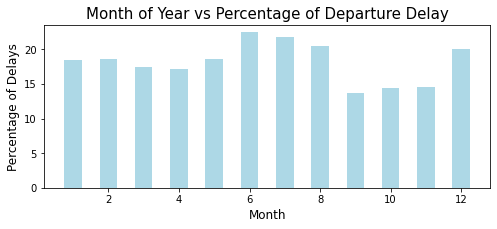

Text(0.5, 1.0, 'Month of Year vs Percentage of Departure Delay')

In [0]:
fig = plt.figure(figsize = (8, 3))

bar_width = 0.5

plt.bar(month_delay['MONTH'] , month_delay['Percentage_of_Delays'],  
            width=bar_width, label='Percentage_of_Delays', color='lightblue')
plt.xlabel('Month', fontsize = 12)
plt.ylabel('Percentage of Delays', fontsize = 12)
plt.title('MONTH_OF_YEAR vs Percentage of Departure Delay', fontsize = 15)

##### - Quarter

In [0]:
quarter_delay = df_airlines.select( 'QUARTER','DEP_DEL15' ).groupBy('QUARTER').agg(f.sum('DEP_DEL15'), count('DEP_DEL15')).withColumnRenamed('sum(DEP_DEL15)', 'Num_Departure_Delay').withColumnRenamed('count(DEP_DEL15)', 'Num_of_Flights')  
quarter_delay = quarter_delay.withColumn("Percentage_of_Delays", round(quarter_delay.Num_Departure_Delay/quarter_delay.Num_of_Flights * 100, 3))
quarter_delay = quarter_delay.toPandas()
quarter_delay = quarter_delay.sort_values(by='QUARTER')

display(quarter_delay)

QUARTER,Num_Departure_Delay,Num_of_Flights,Percentage_of_Delays
1,2677092.0,14755810,18.143
2,3103712.0,15955582,19.452
3,3054338.0,16211684,18.84
4,2551940.0,15616014,16.342


Out[4]:

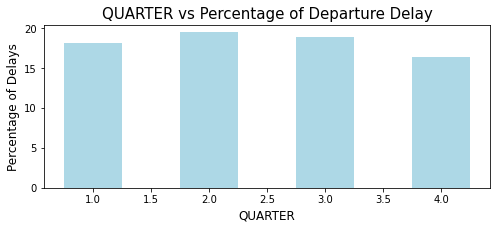

Text(0.5, 1.0, 'QUARTER vs Percentage of Departure Delay')

In [0]:
fig = plt.figure(figsize = (8, 3))

bar_width = 0.5

plt.bar(quarter_delay['QUARTER'] , quarter_delay['Percentage_of_Delays'],  
            width=bar_width, label='Percentage_of_Delays', color='lightblue')
plt.xlabel('QUARTER', fontsize = 12)
plt.ylabel('Percentage of Delays', fontsize = 12)
plt.title('QUARTER vs Percentage of Departure Delay', fontsize = 15)

##### - Day of Week

In [0]:
day_of_week_delay = df_airlines.select( 'DAY_OF_WEEK','DEP_DEL15' ).groupBy('DAY_OF_WEEK').agg(f.sum('DEP_DEL15'), count('DEP_DEL15')).withColumnRenamed('sum(DEP_DEL15)', 'Num_Departure_Delay').withColumnRenamed('count(DEP_DEL15)', 'Num_of_Flights')   
day_of_week_delay = day_of_week_delay.withColumn("Percentage_of_Delays", round(day_of_week_delay.Num_Departure_Delay/day_of_week_delay.Num_of_Flights * 100, 3))
day_of_week_delay = day_of_week_delay.toPandas()
day_of_week_delay = day_of_week_delay.sort_values(by='DAY_OF_WEEK')
display(day_of_week_delay)

DAY_OF_WEEK,Num_Departure_Delay,Num_of_Flights,Percentage_of_Delays
1,1778332.0,9292774,19.137
2,1544244.0,9033326,17.095
3,1559306.0,9118976,17.1
4,1812084.0,9282810,19.521
5,1850172.0,9349040,19.79
6,1239448.0,7621672,16.262
7,1603496.0,8840492,18.138


Out[36]:

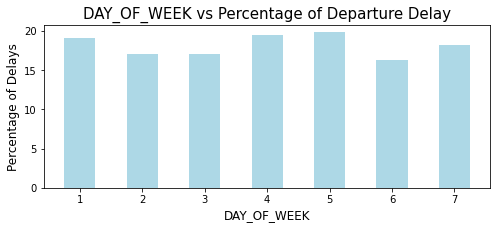

Text(0.5, 1.0, 'DAY_OF_WEEK vs Percentage of Departure Delay')

In [0]:
fig = plt.figure(figsize = (8, 3))
bar_width = 0.5

plt.bar(day_of_week_delay['DAY_OF_WEEK'] , day_of_week_delay['Percentage_of_Delays'],  
            width=bar_width, label='Percentage_of_Delays', color='lightblue')
plt.xlabel('DAY_OF_WEEK', fontsize = 12)
plt.ylabel('Percentage of Delays', fontsize = 12)
plt.title('DAY_OF_WEEK vs Percentage of Departure Delay', fontsize = 15)

#####- Hour of Day

In [0]:
# Get Hour from CRS_DEP_TIME
df_airlines = df_airlines.withColumn("PADDED_DEP_TIME", format_string("0000%d", "CRS_DEP_TIME"))
df_airlines = df_airlines.withColumn("FORMATTED_DEP_TIME", substring("PADDED_DEP_TIME", -4,4))
df_airlines = df_airlines.withColumn("DEPT_DT_STR", concat_ws(" ", df_airlines.FL_DATE, df_airlines.FORMATTED_DEP_TIME))
df_airlines = df_airlines.withColumn("DEPT_DT", to_timestamp(df_airlines.DEPT_DT_STR, "yyyy-MM-dd HHmm"))
df_airlines = df_airlines.withColumn('LOCAL_DEP_HOUR', hour(df_airlines.DEPT_DT))
columns_to_drop = ['PADDED_DEP_TIME', 'FORMATTED_DEP_TIME', 'DEPT_DT_STR', 'DEPT_DT']
df_airlines = df_airlines.drop(*columns_to_drop)
display(df_airlines)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_AIRPORT,DIV2_AIRPORT_ID,DIV2_AIRPORT_SEQ_ID,DIV2_WHEELS_ON,DIV2_TOTAL_GTIME,DIV2_LONGEST_GTIME,DIV2_WHEELS_OFF,DIV2_TAIL_NUM,DIV3_AIRPORT,DIV3_AIRPORT_ID,DIV3_AIRPORT_SEQ_ID,DIV3_WHEELS_ON,DIV3_TOTAL_GTIME,DIV3_LONGEST_GTIME,DIV3_WHEELS_OFF,DIV3_TAIL_NUM,DIV4_AIRPORT,DIV4_AIRPORT_ID,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_AIRPORT_SEQ_ID,DIV5_WHEELS_ON,DIV5_TOTAL_GTIME,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF,DIV5_TAIL_NUM,LOCAL_DEP_HOUR
2019,3,7,31,3,2019-07-31,WN,19393,WN,N908WN,555,10693,1069302,30693,BNA,"Nashville, TN",TN,47,Tennessee,54,13487,1348702,31650,MSP,"Minneapolis, MN",MN,27,Minnesota,63,1045,1058,13.0,13.0,0.0,0,1000-1059,10.0,1108,1254,4.0,1255,1258,3.0,3.0,0.0,0,1200-1259,0.0,null,0.0,130.0,120.0,106.0,1.0,695.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,10
2019,3,7,31,3,2019-07-31,WN,19393,WN,N415WN,2300,10693,1069302,30693,BNA,"Nashville, TN",TN,47,Tennessee,54,13487,1348702,31650,MSP,"Minneapolis, MN",MN,27,Minnesota,63,1815,1813,-2.0,0.0,0.0,-1,1800-1859,9.0,1822,2006,11.0,2020,2017,-3.0,0.0,0.0,-1,2000-2059,0.0,null,0.0,125.0,124.0,104.0,1.0,695.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,18
2019,3,7,31,3,2019-07-31,WN,19393,WN,N966WN,443,10693,1069302,30693,BNA,"Nashville, TN",TN,47,Tennessee,54,13495,1349505,33495,MSY,"New Orleans, LA",LA,22,Louisiana,72,1945,1953,8.0,8.0,0.0,0,1900-1959,12.0,2005,2110,2.0,2105,2112,7.0,7.0,0.0,0,2100-2159,0.0,null,0.0,80.0,79.0,65.0,1.0,471.0,2,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,19
2019,3,7,31,3,2019-07-31,WN,19393,WN,N403WN,1371,10693,1069302,30693,BNA,"Nashville, TN",TN,47,Tennessee,54,13495,1349505,33495,MSY,"New Orleans, LA",LA,22,Louisiana,72,1330,1337,7.0,7.0,0.0,0,1300-1359,9.0,1346,1451,4.0,1505,1455,-10.0,0.0,0.0,-1,1500-1559,0.0,null,0.0,95.0,78.0,65.0,1.0,471.0,2,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,13
2019,3,7,31,3,2019-07-31,WN,19393,WN,N423WN,2483,10693,1069302,30693,BNA,"Nashville, TN",TN,47,Tennessee,54,13495,1349505,33495,MSY,"New 

In [0]:
hour_of_day_delay = df_airlines.select( 'LOCAL_DEP_HOUR','DEP_DEL15' ).groupBy('LOCAL_DEP_HOUR').agg(f.sum('DEP_DEL15'), count('DEP_DEL15')).withColumnRenamed('sum(DEP_DEL15)', 'Num_Departure_Delay').withColumnRenamed('count(DEP_DEL15)', 'Num_of_Flights')
hour_of_day_delay = hour_of_day_delay.withColumn("Percentage_of_Delays", round(hour_of_day_delay.Num_Departure_Delay/hour_of_day_delay.Num_of_Flights * 100, 3))
hour_of_day_delay = hour_of_day_delay.toPandas()
hour_of_day_delay = hour_of_day_delay.sort_values(by='LOCAL_DEP_HOUR')
display(hour_of_day_delay)

LOCAL_DEP_HOUR,Num_Departure_Delay,Num_of_Flights,Percentage_of_Delays
0,28058.0,160384,17.494
1,9684.0,58998,16.414
2,4118.0,17526,23.497
3,3248.0,12352,26.295
4,1604.0,7122,22.522
5,82464.0,1411946,5.84
6,293502.0,4464746,6.574
7,369070.0,4248596,8.687
8,445048.0,4151608,10.72
9,482300.0,3738818,12.9


Out[40]:

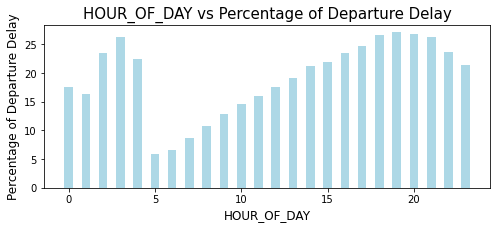

Text(0.5, 1.0, 'HOUR_OF_DAY vs Percentage of Departure Delay')

In [0]:
fig = plt.figure(figsize = (8, 3))
bar_width = 0.5

plt.bar(hour_of_day_delay['LOCAL_DEP_HOUR'] , hour_of_day_delay['Percentage_of_Delays'],  
            width=bar_width, label='Percentage_of_Delays', color='lightblue')
plt.xlabel('HOUR_OF_DAY', fontsize = 12)
plt.ylabel('Percentage of Departure Delay', fontsize = 12)
plt.title('HOUR_OF_DAY vs Percentage of Departure Delay', fontsize = 15)

Out[12]:

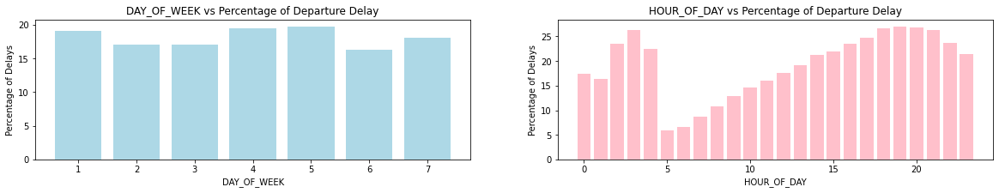

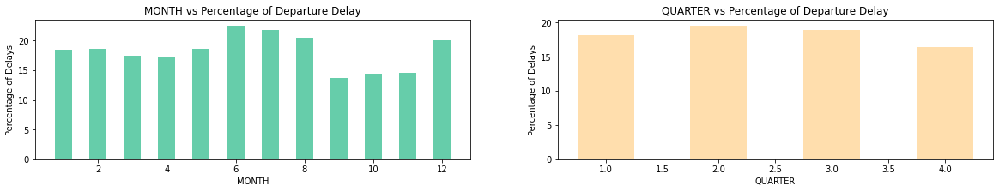

Text(0.5, 1.0, 'QUARTER vs Percentage of Departure Delay')

In [0]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (20, 3))

ax1.bar(day_of_week_delay['DAY_OF_WEEK'] , day_of_week_delay['Percentage_of_Delays'],  
            label='Percentage_of_Delays', color='lightblue')
ax1.set_xlabel('DAY_OF_WEEK')
ax1.set_ylabel('Percentage of Delays')
ax1.set_title('DAY_OF_WEEK vs Percentage of Departure Delay')

ax2.bar(hour_of_day_delay['LOCAL_DEP_HOUR'] , hour_of_day_delay['Percentage_of_Delays'],  
            label='Percentage_of_Delays', color='pink')
ax2.set_xlabel('HOUR_OF_DAY')
ax2.set_ylabel('Percentage of Delays')
ax2.set_title('HOUR_OF_DAY vs Percentage of Departure Delay')

fig, (ax3, ax4) = plt.subplots(1, 2, figsize = (20, 3))

ax3.bar(month_delay['MONTH'] , month_delay['Percentage_of_Delays'],  
            width=bar_width, label='Percentage_of_Delays', color='mediumaquamarine')
ax3.set_xlabel('MONTH')
ax3.set_ylabel('Percentage of Delays')
ax3.set_title('MONTH vs Percentage of Departure Delay')

ax4.bar(quarter_delay['QUARTER'] , quarter_delay['Percentage_of_Delays'],  
            width=bar_width, label='Percentage_of_Delays', color='navajowhite')
ax4.set_xlabel('QUARTER')
ax4.set_ylabel('Percentage of Delays')
ax4.set_title('QUARTER vs Percentage of Departure Delay')



#### 4. Airport factor

In [0]:
# Explore Top 10 Origin Airports with Most Deplay
origin_airport_dep_delay = df_airlines.select( 'ORIGIN','DEP_DEL15' ).groupBy('ORIGIN').agg(f.sum('DEP_DEL15'), count('DEP_DEL15')).withColumnRenamed('sum(DEP_DEL15)', 'Num_Departure_Delay').withColumnRenamed('count(DEP_DEL15)', 'Num_of_Flights')
origin_airport_dep_delay = origin_airport_dep_delay.withColumn("Percentage_of_Delays", round(origin_airport_dep_delay.Num_Departure_Delay/origin_airport_dep_delay.Num_of_Flights * 100, 3))
origin_airport_dep_delay_df = origin_airport_dep_delay.toPandas()
origin_airport_dep_delay_df_sort = origin_airport_dep_delay_df.sort_values(by='Percentage_of_Delays', ascending=False)
origin_airports_top10 = origin_airport_dep_delay_df_sort.head(10)
display(origin_airports_top10)

ORIGIN,Num_Departure_Delay,Num_of_Flights,Percentage_of_Delays
ENV,2.0,2,100.0
TKI,2.0,2,100.0
YNG,4.0,4,100.0
ILG,78.0,194,40.206
OTH,1080.0,3184,33.92
OGD,152.0,458,33.188
HGR,210.0,640,32.813
ADK,320.0,992,32.258
OWB,134.0,416,32.212
SCK,1098.0,3546,30.964


Out[16]:

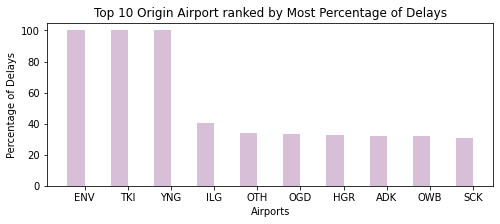

([<matplotlib.axis.XTick at 0x7f57e43fedf0>,
 <matplotlib.axis.XTick at 0x7f57e44095b0>,
 <matplotlib.axis.XTick at 0x7f57e4309610>,
 <matplotlib.axis.XTick at 0x7f57e42c8f10>,
 <matplotlib.axis.XTick at 0x7f57e42d76a0>,
 <matplotlib.axis.XTick at 0x7f57e42d7df0>,
 <matplotlib.axis.XTick at 0x7f57e42db580>,
 <matplotlib.axis.XTick at 0x7f57e42dbcd0>,
 <matplotlib.axis.XTick at 0x7f57e42dbee0>,
 <matplotlib.axis.XTick at 0x7f57e42d7a90>],
 [Text(0.2, 0, 'ENV'),
 Text(1.2, 0, 'TKI'),
 Text(2.2, 0, 'YNG'),
 Text(3.2, 0, 'ILG'),
 Text(4.2, 0, 'OTH'),
 Text(5.2, 0, 'OGD'),
 Text(6.2, 0, 'HGR'),
 Text(7.2, 0, 'ADK'),
 Text(8.2, 0, 'OWB'),
 Text(9.2, 0, 'SCK')])

In [0]:
fig = plt.figure(figsize = (8, 3))
number_of_airports = np.arange(len(origin_airports_top10['ORIGIN'].unique()))
bar_width = 0.4

plt.bar(np.arange(len(origin_airports_top10['ORIGIN'].unique())), origin_airports_top10['Percentage_of_Delays'],
            width=bar_width, label='Percentage_of_Delays', color='thistle')
 
plt.ylabel("Percentage of Delays")
plt.xlabel("Airports")
plt.title("Top 10 Origin Airport ranked by Most Percentage of Delays")
plt.xticks(number_of_airports + bar_width / 2, origin_airports_top10['ORIGIN'].unique())


This does not make much sense because these are not the busiest and most heavily traveled connection hubs in the United States as far as we know. The busiest connection hub airports such as Dallas/Fort Worth (DFW), Chicago–O'Hare (ORD), Los Angeles (LAX), New York–Kennedy (JFK) are not found in the top 10 aiports with most percentage of delays here.

### Missing Values and Outliers for features that can be used in our model

#### Numeric Features: DISTANCE, CRS_ELASPED_TIME

In [0]:
selected_features_flight = df_airlines.select('DISTANCE', 'CRS_ELAPSED_TIME').withColumnRenamed('DISTANCE', 'DISTANCE(miles)').withColumnRenamed('CRS_ELAPSED_TIME', 'CRS_ELAPSED_TIME(minutes)')

selected_features_flight = selected_features_flight.toPandas()

Out[88]:

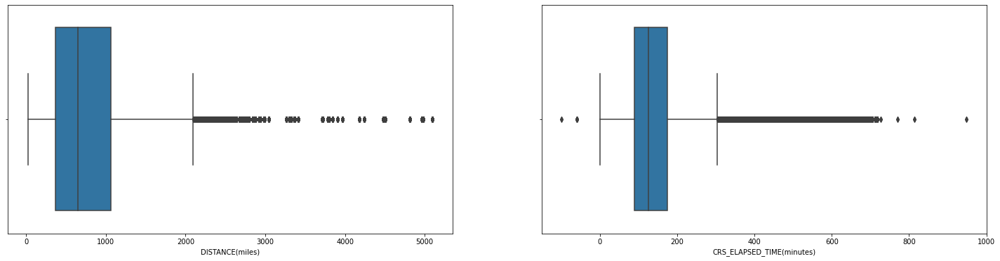

<AxesSubplot:xlabel='CRS_ELAPSED_TIME(minutes)'>

In [0]:
fig, ax_grid = fig, ax_grid = plt.subplots(1,2, figsize=(25,6))

sns.boxplot(x = 'DISTANCE(miles)', data=selected_features_flight, ax=ax_grid[0])
sns.boxplot(x = 'CRS_ELAPSED_TIME(minutes)', data=selected_features_flight, ax=ax_grid[1])

/databricks/python/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
 warnings.warn(msg, FutureWarning)
Out[85]:

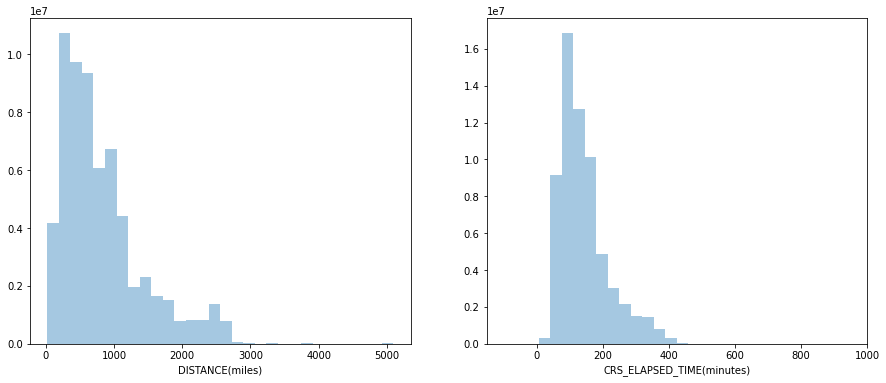

<AxesSubplot:xlabel='CRS_ELAPSED_TIME(minutes)'>

In [0]:
fig, ax_grid = plt.subplots(1,2, figsize=(15, 6))

sns.distplot(selected_features_flight['DISTANCE(miles)'], bins = 30, kde = False, ax=ax_grid[0])
sns.distplot(selected_features_flight['CRS_ELAPSED_TIME(minutes)'], bins = 30, kde = False, ax=ax_grid[1])

In [0]:
selected_features_flight[['DISTANCE(miles)']].describe()

Out[105]:

,DISTANCE(miles)
count,6.349368e+07
mean,8.232170e+02
std,6.076827e+02
min,2.100000e+01
25%,3.720000e+02
50%,6.510000e+02
75%,1.062000e+03
max,5.095000e+03


In [0]:
selected_features_flight[['CRS_ELAPSED_TIME(minutes)']].describe()

Out[113]:

,CRS_ELAPSED_TIME(minutes)
count,6.349335e+07
mean,1.432167e+02
std,7.473118e+01
min,-9.900000e+01
25%,8.900000e+01
50%,1.250000e+02
75%,1.750000e+02
max,9.480000e+02


In [0]:
selected_features_flight['DISTANCE(miles)'].quantile(0.25)

Out[106]: 372.0

In [0]:
selected_features_flight['DISTANCE(miles)'].quantile(0.75)

Out[107]: 1062.0

In [0]:
# log_distance = np.log(selected_features_flight['DISTANCE(miles)'])
# sns.boxplot(x = log_distance)

## Station

### Check for Duplicates

In [0]:
df_stations_without_duplicates = df_stations.dropDuplicates()
duplicate_count = df_stations.count() - df_stations_without_duplicates.count()
print(f'Total records in Station Table: {df_stations.count()}')
print(f'Number of duplicates in Station Table: {duplicate_count}')
print(f'The percentage of duplicate records: {duplicate_count / df_stations.count() * 100} %')

Total records in Station Table: 5004169
Number of duplicates in Station Table: 0
The percentage of duplicate records: 0.0 %

In [0]:
# Filter Stations on distance_to_neighbor = 0 to get station = neighbor

filtered_df_stations = df_stations.filter(col("distance_to_neighbor") == 0)
display(filtered_df_stations)
filtered_df_stations.createOrReplaceTempView("filtered_df_stations")

usaf,wban,station_id,lat,lon,neighbor_id,neighbor_name,neighbor_state,neighbor_call,neighbor_lat,neighbor_lon,distance_to_neighbor
690020,93218,69002093218,36.0,-121.233,69002093218,JOLON HUNTER LIGGETT MIL RES,CA,KHGT,36.0,-121.233,0.0
690070,93217,69007093217,36.683,-121.767,69007093217,FRITZSCHE AAF,CA,KOAR,36.683,-121.767,0.0
690140,93101,69014093101,33.667,-117.733,69014093101,EL TORO MCAS,CA,KNZJ,33.667,-117.733,0.0
700271,27506,70027127506,71.333,-156.65,70027127506,BARROW POINT BARROW,AK,KPBA,71.333,-156.65,0.0
700450,27512,70045027512,70.917,-153.25,70045027512,LONELY,AK,LNI,70.917,-153.25,0.0
700630,27403,70063027403,70.5,-149.883,70063027403,OLIKTOK POW 2,AK,POLI,70.5,-149.883,0.0
700635,26465,70063526465,68.479,-149.49,70063526465,GALBRAITH LAKE AIRPORT,AK,PAGB,68.479,-149.49,0.0
700636,27405,70063627405,70.25,-148.333,70063627405,PRUDHOE BAY,AK,PAUD,70.25,-148.333,0.0
701046,26418,70104626418,65.567,-144.765,70104626418,CENTRAL AIRPORT,AK,PACE,65.567,-144.765,0.0
701195,26625,70119526625,66.25,-166.089,70119526625,SHISHMAREF/NEW AIRPORT,AK,PASH,66.25,-166.089,0.0


In [0]:
# Get all unique airports (ORIGIN + DEST)

origin_airports = df_airlines.select("ORIGIN").distinct().collect()
dest_airports = df_airlines.select("DEST").distinct().collect()
all_airports = set([origin["ORIGIN"] for origin in origin_airports] + [dest["DEST"] for dest in dest_airports])
all_unique_airports = spark.createDataFrame([[airport] for airport in sorted(all_airports)], ["AIRPORT"])

display(all_unique_airports)

AIRPORT
ABE
ABI
ABQ
ABR
ABY
ACK
ACT
ACV
ACY
ADK


In [0]:
join_station_to_get_airport_codes_query = """
select * 
from 
(select * from filtered_df_stations) as Station 
left join 
(select ICAO, IATA, Country, Timezone, DST, TZ_Timezone from airport_code) as Airport_Code
on Station.neighbor_call = Airport_Code.ICAO
"""
stations_with_airport_codes = spark.sql(join_station_to_get_airport_codes_query)
display(stations_with_airport_codes)

usaf,wban,station_id,lat,lon,neighbor_id,neighbor_name,neighbor_state,neighbor_call,neighbor_lat,neighbor_lon,distance_to_neighbor,ICAO,IATA,Country,Timezone,DST,TZ_Timezone
702640,26414,70264026414,63.331,-149.127,70264026414,SUMMIT,AK,PAST,63.331,-149.127,0.0,null,null,null,null,null,null
702490,26526,70249026526,62.091,-152.735,70249026526,PUNTILLA LAKE,AK,PAPT,62.091,-152.735,0.0,null,null,null,null,null,null
702770,26438,70277026438,60.128,-149.417,70277026438,SEWARD AIRPORT,AK,PAWD,60.128,-149.417,0.0,PAWD,SWD,United States,-9,U,America/Anchorage
703061,25521,70306125521,59.324,-155.902,70306125521,IGIUGIG AIRPORT,AK,PAIG,59.324,-155.902,0.0,PAIG,IGG,United States,-9,A,America/Anchorage
703855,25369,70385525369,56.967,-133.9,70385525369,KAKE AIRPORT,AK,PAFE,56.967,-133.9,0.0,PAFE,\N,United States,-9,A,America/Anchorage
720354,63901,72035463901,34.699,-99.338,72035463901,ALTUS/QUARTZ MOUNTAIN REGIONA,OK,KAXS,34.699,-99.338,0.0,null,null,null,null,null,null
722196,53863,72219653863,33.875,-84.302,72219653863,DEKALB-PEACHTREE AIRPORT,GA,KPDK,33.875,-84.302,0.0,KPDK,PDK,United States,-5,A,America/New_York
722190,13874,72219013874,33.63,-84.442,72219013874,HARTSFIELD-JACKSON ATLANTA IN,GA,KATL,33.63,-84.442,0.0,KATL,ATL,United States,-5,A,America/New_York
746939,93785,74693993785,35.933,-79.064,74693993785,HORACE WILLIAMS AIRPORT,NC,KIGX,35.933,-79.064,0.0,KIGX,\N,United States,-5,A,\N
727119,94605,72711994605,46.617,-69.533,72711994605,CLAYTON LAKE,ME,K40B,46.617,-69.533,0.0,null,null,null,null,null,null


In [0]:
filtered_stations_in_flights_table = stations_with_airport_codes.filter(stations_with_airport_codes.IATA.isin(all_airports))
display(filtered_stations_in_flights_table)

usaf,wban,station_id,lat,lon,neighbor_id,neighbor_name,neighbor_state,neighbor_call,neighbor_lat,neighbor_lon,distance_to_neighbor,ICAO,IATA,Country,Timezone,DST,TZ_Timezone
785140,11603,78514011603,18.498,-67.129,78514011603,RAFAEL HERNANDEZ AIRPORT,PR,TJBQ,18.498,-67.129,0.0,TJBQ,BQN,Puerto Rico,-4,U,America/Puerto_Rico
700260,27502,70026027502,71.283,-156.782,70026027502,W POST-WILL ROGERS MEMORIAL A,AK,PABR,71.283,-156.782,0.0,PABR,BRW,United States,-9,A,America/Anchorage
700637,27406,70063727406,70.192,-148.477,70063727406,DEADHORSE AIRPORT,AK,PASC,70.192,-148.477,0.0,PASC,SCC,United States,-9,A,America/Anchorage
701330,26616,70133026616,66.867,-162.633,70133026616,RALPH WIEN MEMORIAL AIRPORT,AK,PAOT,66.867,-162.633,0.0,PAOT,OTZ,United States,-9,A,America/Anchorage
702190,26615,70219026615,60.785,-161.829,70219026615,BETHEL AIRPORT,AK,PABE,60.785,-161.829,0.0,PABE,BET,United States,-9,A,America/Anchorage
702610,26411,70261026411,64.804,-147.876,70261026411,FAIRBANKS INTERNATIONAL,AK,PAFA,64.804,-147.876,0.0,PAFA,FAI,United States,-9,A,America/Anchorage
702730,26451,70273026451,61.169,-150.028,70273026451,TED STEVENS ANCHORAGE INTL,AK,PANC,61.169,-150.028,0.0,PANC,ANC,United States,-9,A,America/Anchorage
702960,26410,70296026410,60.489,-145.451,70296026410,M.K.(MUDHOLE) SMITH ARPT,AK,PACV,60.489,-145.451,0.0,PACV,CDV,United States,-9,A,America/Anchorage
703210,25513,70321025513,59.05,-158.517,70321025513,DILLINGHAM AIRPORT,AK,PADL,59.05,-158.517,0.0,PADL,DLG,United States,-9,A,America/Anchorage
703260,25503,70326025503,58.683,-156.656,70326025503,KING SALMON AIRPORT,AK,PAKN,58.683,-156.656,0.0,PAKN,AKN,United States,-9,A,America/Anchorage


In [0]:
unique_airports = all_unique_airports.select('AIRPORT').distinct().toPandas()
unique_IATA = filtered_stations_in_flights_table.select('IATA').distinct().toPandas()
#display(unique_IATA)

In [0]:
set(unique_airports['AIRPORT'])-set(unique_IATA['IATA'])

Out[53]: {'EAR', 'GUM', 'IFP', 'OGS', 'PPG', 'PSE', 'SJU', 'SPN', 'TKI', 'XWA'}

In [0]:
origin_airports = df_airlines.select("ORIGIN").distinct().collect()
dest_airports = df_airlines.select("DEST").distinct().collect()
all_origin_airports = set([origin["ORIGIN"] for origin in origin_airports])
all_dest_airports = set([dest["DEST"] for dest in dest_airports])
all_origin_airports_df = spark.createDataFrame([[airport] for airport in sorted(all_origin_airports)], ["AIRPORT"])
all_dest_airports_df = spark.createDataFrame([[airport] for airport in sorted(all_dest_airports)], ["AIRPORT"])

In [0]:
unique_origin_airports = all_origin_airports_df.select('AIRPORT').distinct().toPandas()
unique_dest_airports = all_dest_airports_df.select('AIRPORT').distinct().toPandas()

print('Missing Origin Airports: ' + str(set(unique_origin_airports['AIRPORT'])-set(unique_IATA['IATA'])))
print('Missing Dest Airports: ' + str(set(unique_dest_airports['AIRPORT'])-set(unique_IATA['IATA'])))


Missing Origin Airports: {'PPG', 'TKI', 'SPN', 'SJU', 'GUM', 'XWA', 'EAR', 'OGS', 'PSE', 'IFP'}
Missing Dest Airports: {'PPG', 'SPN', 'SJU', 'GUM', 'XWA', 'EAR', 'OGS', 'PSE', 'IFP'}

In [0]:
open_flights_iata = airport_code.select('IATA').distinct().toPandas()

In [0]:
join_flights_with_airport_codes_query = """
select * 
from 
(select * from flights) as Flight 
left join 
(select ICAO, IATA, Country, Timezone, DST, TZ_Timezone from airport_code) as Airport_Code
on Flight.ORIGIN = Airport_Code.IATA
"""
flights_origin_with_airport_codes = spark.sql(join_flights_with_airport_codes_query)
display(flights_origin_with_airport_codes)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_AIRPORT,DIV2_AIRPORT_ID,DIV2_AIRPORT_SEQ_ID,DIV2_WHEELS_ON,DIV2_TOTAL_GTIME,DIV2_LONGEST_GTIME,DIV2_WHEELS_OFF,DIV2_TAIL_NUM,DIV3_AIRPORT,DIV3_AIRPORT_ID,DIV3_AIRPORT_SEQ_ID,DIV3_WHEELS_ON,DIV3_TOTAL_GTIME,DIV3_LONGEST_GTIME,DIV3_WHEELS_OFF,DIV3_TAIL_NUM,DIV4_AIRPORT,DIV4_AIRPORT_ID,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_AIRPORT_SEQ_ID,DIV5_WHEELS_ON,DIV5_TOTAL_GTIME,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF,DIV5_TAIL_NUM,PADDED_DEP_TIME,FORMATTED_DEP_TIME,DEPT_DT_STR,DEPT_DT,DEPT_HOUR,local_departure_hour,ICAO,IATA,Country,Timezone,DST,TZ_Timezone
2019,3,7,31,3,2019-07-31,WN,19393,WN,N7839A,2543,10800,1080003,32575,BUR,"Burbank, CA",CA,6,California,91,10693,1069302,30693,BNA,"Nashville, TN",TN,47,Tennessee,54,1050,1048,-2.0,0.0,0.0,-1,1000-1059,11.0,1059,1636,6.0,1650,1642,-8.0,0.0,0.0,-1,1600-1659,0.0,null,0.0,240.0,234.0,217.0,1.0,1791.0,8,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,00001050,1050,2019-07-31 1050,2019-07-31T10:50:00.000+0000,2019-07-31T10:00:00.000+0000,10,KBUR,BUR,United States,-8,A,America/Los_Angeles
2019,3,7,31,3,2019-07-31,WN,19393,WN,N791SW,1562,10800,1080003,32575,BUR,"Burbank, CA",CA,6,California,91,11259,1125904,30194,DAL,"Dallas, TX",TX,48,Texas,74,935,934,-1.0,0.0,0.0,-1,0900-0959,10.0,944,1430,3.0,1440,1433,-7.0,0.0,0.0,-1,1400-1459,0.0,null,0.0,185.0,179.0,166.0,1.0,1243.0,5,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,0000935,0935,2019-07-31 0935,2019-07-31T09:35:00.000+0000,2019-07-31T09:00:00.000+0000,9,KBUR,BUR,United States,-8,A,America/Los_Angeles
2019,3,7,31,3,2019-07-31,WN,19393,WN,N212WN,1866,10800,1080003,32575,BUR,"Burbank, CA",CA,6,California,91,11292,1129202,30325,DEN,"Denver, CO",CO,8,Colorado,82,1315,1343,28.0,28.0,1.0,1,1300-1359,10.0,1353,1639,6.0,1635,1645,10.0,10.0,0.0,0,1600-1659,0.0,null,0.0,140.0,122.0,106.0,1.0,850.0,4,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,00001315,1315,2019-07-31 1315,2019-07-31T13:15:00.000+0000,2019-07-31T13:00:00.000+0000,13,KBUR,BUR,United States,-8,A,America/Los_Angeles
2019,3,7,31,3,2019-07-31,WN,19393,WN,N7728D,2004,10800,1080003,32575,BUR,"Burbank, CA",CA,6,California,91,11292,1129202,30325,DEN,"Denver, CO",CO,8,Colorado,82,1740,1737,-3.0,0.0,0.0,-1,1700-175

In [0]:
join_dest_flights_with_airport_codes_query = """
select * 
from 
(select * from flights) as Flight 
left join 
(select ICAO, IATA, Country, Timezone, DST, TZ_Timezone from airport_code) as Airport_Code
on Flight.DEST = Airport_Code.IATA
"""
flights_dest_with_airport_codes = spark.sql(join_dest_flights_with_airport_codes_query)
display(flights_dest_with_airport_codes)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_AIRPORT,DIV2_AIRPORT_ID,DIV2_AIRPORT_SEQ_ID,DIV2_WHEELS_ON,DIV2_TOTAL_GTIME,DIV2_LONGEST_GTIME,DIV2_WHEELS_OFF,DIV2_TAIL_NUM,DIV3_AIRPORT,DIV3_AIRPORT_ID,DIV3_AIRPORT_SEQ_ID,DIV3_WHEELS_ON,DIV3_TOTAL_GTIME,DIV3_LONGEST_GTIME,DIV3_WHEELS_OFF,DIV3_TAIL_NUM,DIV4_AIRPORT,DIV4_AIRPORT_ID,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_AIRPORT_SEQ_ID,DIV5_WHEELS_ON,DIV5_TOTAL_GTIME,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF,DIV5_TAIL_NUM,PADDED_DEP_TIME,FORMATTED_DEP_TIME,DEPT_DT_STR,DEPT_DT,DEPT_HOUR,local_departure_hour,ICAO,IATA,Country,Timezone,DST,TZ_Timezone
2019,3,7,31,3,2019-07-31,WN,19393,WN,N966WN,443,10693,1069302,30693,BNA,"Nashville, TN",TN,47,Tennessee,54,13495,1349505,33495,MSY,"New Orleans, LA",LA,22,Louisiana,72,1945,1953,8.0,8.0,0.0,0,1900-1959,12.0,2005,2110,2.0,2105,2112,7.0,7.0,0.0,0,2100-2159,0.0,null,0.0,80.0,79.0,65.0,1.0,471.0,2,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,00001945,1945,2019-07-31 1945,2019-07-31T19:45:00.000+0000,2019-07-31T19:00:00.000+0000,19,KMSY,MSY,United States,-6,A,America/Chicago
2019,3,7,31,3,2019-07-31,WN,19393,WN,N403WN,1371,10693,1069302,30693,BNA,"Nashville, TN",TN,47,Tennessee,54,13495,1349505,33495,MSY,"New Orleans, LA",LA,22,Louisiana,72,1330,1337,7.0,7.0,0.0,0,1300-1359,9.0,1346,1451,4.0,1505,1455,-10.0,0.0,0.0,-1,1500-1559,0.0,null,0.0,95.0,78.0,65.0,1.0,471.0,2,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,00001330,1330,2019-07-31 1330,2019-07-31T13:30:00.000+0000,2019-07-31T13:00:00.000+0000,13,KMSY,MSY,United States,-6,A,America/Chicago
2019,3,7,31,3,2019-07-31,WN,19393,WN,N423WN,2483,10693,1069302,30693,BNA,"Nashville, TN",TN,47,Tennessee,54,13495,1349505,33495,MSY,"New Orleans, LA",LA,22,Louisiana,72,745,750,5.0,5.0,0.0,0,0700-0759,10.0,800,903,2.0,915,905,-10.0,0.0,0.0,-1,0900-0959,0.0,null,0.0,90.0,75.0,63.0,1.0,471.0,2,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,0000745,0745,2019-07-31 0745,2019-07-31T07:45:00.000+0000,2019-07-31T07:00:00.000+0000,7,KMSY,MSY,United States,-6,A,America/Chicago
2019,3,7,31,3,2019-07-31,WN,19393,WN,N413WN,2514,10693,1069302,30693,BNA,"Nashville, TN",TN,47,Tennessee,54,13495,1349505,33495,MSY,"New Orleans, LA",LA,22,Louisiana,72,1645,1647,2.0,2.0,0.0,0,1600-1659,9

In [0]:
origin_flights_iata = flights_origin_with_airport_codes.select('IATA').distinct().toPandas()
dest_flights_iata = flights_dest_with_airport_codes.select('IATA').distinct().toPandas()

In [0]:
print('Missing Airports - Comparing Openflight and Flights(ORIGIN): ' + str(set(unique_origin_airports['AIRPORT'])-set(origin_flights_iata['IATA'])))
print('Missing Airports - Comparing Openflight and Flights(DEST): ' + str(set(unique_dest_airports['AIRPORT'])-set(dest_flights_iata['IATA'])))

Missing Airports - Comparing Openflight and Flights(ORIGIN): {'XWA', 'EAR', 'TKI', 'IFP'}
Missing Airports - Comparing Openflight and Flights(DEST): {'XWA', 'EAR', 'IFP'}

##Weather (2015 Q1)

### Check for Duplicates

In [0]:
df_weather_without_duplicates = df_weather.dropDuplicates()
duplicate_count = df_weather.count() - df_weather_without_duplicates.count()

print(f'Total records in Weather Table: {df_weather.count()}')
print(f'Number of duplicates in Weather Table: {duplicate_count}')
print(f'The percentage of duplicate records: {duplicate_count / df_weather.count() * 100} %')

Total records in Flight Table: 29823926
Total records without duplicates in Flight Table: 29823926

#Feature Engineering

##Derived Features

### Extraction of Local Departure Hour

Intuitively, we feel that the departure time of flights might be in relation to the flight delays, therefore we decided to extract out the local departure hour value from CRS_DEP_TIME variable.

In [0]:
type(df_airlines)

Out[4]: pyspark.sql.dataframe.DataFrame

In [0]:
dict(df_airlines.dtypes)

Out[3]: {'YEAR': 'int',
 'QUARTER': 'int',
 'MONTH': 'int',
 'DAY_OF_MONTH': 'int',
 'DAY_OF_WEEK': 'int',
 'FL_DATE': 'string',
 'OP_UNIQUE_CARRIER': 'string',
 'OP_CARRIER_AIRLINE_ID': 'int',
 'OP_CARRIER': 'string',
 'TAIL_NUM': 'string',
 'OP_CARRIER_FL_NUM': 'int',
 'ORIGIN_AIRPORT_ID': 'int',
 'ORIGIN_AIRPORT_SEQ_ID': 'int',
 'ORIGIN_CITY_MARKET_ID': 'int',
 'ORIGIN': 'string',
 'ORIGIN_CITY_NAME': 'string',
 'ORIGIN_STATE_ABR': 'string',
 'ORIGIN_STATE_FIPS': 'int',
 'ORIGIN_STATE_NM': 'string',
 'ORIGIN_WAC': 'int',
 'DEST_AIRPORT_ID': 'int',
 'DEST_AIRPORT_SEQ_ID': 'int',
 'DEST_CITY_MARKET_ID': 'int',
 'DEST': 'string',
 'DEST_CITY_NAME': 'string',
 'DEST_STATE_ABR': 'string',
 'DEST_STATE_FIPS': 'int',
 'DEST_STATE_NM': 'string',
 'DEST_WAC': 'int',
 'CRS_DEP_TIME': 'int',
 'DEP_TIME': 'int',
 'DEP_DELAY': 'double',
 'DEP_DELAY_NEW': 'double',
 'DEP_DEL15': 'double',
 'DEP_DELAY_GROUP': 'int',
 'DEP_TIME_BLK': 'string',
 'TAXI_OUT': 'double',
 'WHEELS_OFF': 'int',
 'WHEELS_ON': 'int',
 'TAXI_IN': 'double',
 'CRS_ARR_TIME': 'int',
 'ARR_TIME': 'int',
 'ARR_DELAY': 'double',
 'ARR_DELAY_NEW': 'double',
 'ARR_DEL15': 'double',
 'ARR_DELAY_GROUP': 'int',
 'ARR_TIME_BLK': 'string',
 'CANCELLED': 'double',
 'CANCELLATION_CODE': 'string',
 'DIVERTED': 'double',
 'CRS_ELAPSED_TIME': 'double',
 'ACTUAL_ELAPSED_TIME': 'double',
 'AIR_TIME': 'double',
 'FLIGHTS': 'double',
 'DISTANCE': 'double',
 'DISTANCE_GROUP': 'int',
 'CARRIER_DELAY': 'double',
 'WEATHER_DELAY': 'double',
 'NAS_DELAY': 'double',
 'SECURITY_DELAY': 'double',
 'LATE_AIRCRAFT_DELAY': 'double',
 'FIRST_DEP_TIME': 'int',
 'TOTAL_ADD_GTIME': 'double',
 'LONGEST_ADD_GTIME': 'double',
 'DIV_AIRPORT_LANDINGS': 'int',
 'DIV_REACHED_DEST': 'double',
 'DIV_ACTUAL_ELAPSED_TIME': 'double',
 'DIV_ARR_DELAY': 'double',
 'DIV_DISTANCE': 'double',
 'DIV1_AIRPORT': 'string',
 'DIV1_AIRPORT_ID': 'int',
 'DIV1_AIRPORT_SEQ_ID': 'int',
 'DIV1_WHEELS_ON': 'int',
 'DIV1_TOTAL_GTIME': 'double',
 'DIV1_LONGEST_GTIME': 'double',
 'DIV1_WHEELS_OFF': 'int',
 'DIV1_TAIL_NUM': 'string',
 'DIV2_AIRPORT': 'string',
 'DIV2_AIRPORT_ID': 'int',
 'DIV2_AIRPORT_SEQ_ID': 'int',
 'DIV2_WHEELS_ON': 'int',
 'DIV2_TOTAL_GTIME': 'double',
 'DIV2_LONGEST_GTIME': 'double',
 'DIV2_WHEELS_OFF': 'int',
 'DIV2_TAIL_NUM': 'string',
 'DIV3_AIRPORT': 'string',
 'DIV3_AIRPORT_ID': 'int',
 'DIV3_AIRPORT_SEQ_ID': 'int',
 'DIV3_WHEELS_ON': 'int',
 'DIV3_TOTAL_GTIME': 'double',
 'DIV3_LONGEST_GTIME': 'double',
 'DIV3_WHEELS_OFF': 'string',
 'DIV3_TAIL_NUM': 'string',
 'DIV4_AIRPORT': 'string',
 'DIV4_AIRPORT_ID': 'string',
 'DIV4_AIRPORT_SEQ_ID': 'string',
 'DIV4_WHEELS_ON': 'string',
 'DIV4_TOTAL_GTIME': 'string',
 'DIV4_LONGEST_GTIME': 'string',
 'DIV4_WHEELS_OFF': 'string',
 'DIV4_TAIL_NUM': 'string',
 'DIV5_AIRPORT': 'string',
 'DIV5_AIRPORT_ID': 'string',
 'DIV5_AIRPORT_SEQ_ID': 'string',
 'DIV5_WHEELS_ON': 'string',
 'DIV5_TOTAL_GTIME': 'string',
 'DIV5_LONGEST_GTIME': 'string',
 'DIV5_WHEELS_OFF': 'string',
 'DIV5_TAIL_NUM': 'string'}

In [0]:
# Get Hour from CRS_DEP_TIME
df_airlines = df_airlines.withColumn("FORMATTED_CRS_DEP_TIME", substring(format_string("0000%d", "CRS_DEP_TIME"), -4, 4))
df_airlines = df_airlines.withColumn("DATE_WITH_CRS_DEP_TIME", concat_ws(" ", df_airlines.FL_DATE, df_airlines.FORMATTED_CRS_DEP_TIME))
df_airlines = df_airlines.withColumn("LOCAL_DEP_HOUR", hour(to_timestamp(df_airlines.DATE_WITH_CRS_DEP_TIME, "yyyy-MM-dd HHmm")))
columns_to_drop = ['FORMATTED_CRS_DEP_TIME', 'DATE_WITH_CRS_DEP_TIME']
df_airlines = df_airlines.drop(*columns_to_drop)
display(df_airlines)

--------------------------------------------------------------------------- 
 NameError Traceback (most recent call last)
 <command-3816960191362955> in <module> 
 1 # Get Hour from CRS_DEP_TIME 
 ----> 2 df_airlines = df_airlines . withColumn ( "FORMATTED_CRS_DEP_TIME" , substring ( format_string ( "0000%d" , "CRS_DEP_TIME" ) , - 4 , 4 ) ) 
 3 df_airlines = df_airlines . withColumn ( "DATE_WITH_CRS_DEP_TIME" , concat_ws ( " " , df_airlines . FL_DATE , df_airlines . FORMATTED_CRS_DEP_TIME ) ) 
 4 df_airlines = df_airlines . withColumn ( "LOCAL_DEP_HOUR" , hour ( to_timestamp ( df_airlines . DATE_WITH_CRS_DEP_TIME , "yyyy-MM-dd HHmm" ) ) ) 
 5 columns_to_drop = [ 'FORMATTED_CRS_DEP_TIME' , 'DATE_WITH_CRS_DEP_TIME' ] 

 NameError : name 'substring' is not defined

### Holiday Indicator

Since we noticed in EDA that there are some peaks around the holiday seasons, we also decided to include a holiday indicator, which indicates if a date is a public holiday such as Independence Day, Thanksgiving, Christmas, ...etc. we labeled the holiday itself as '1 = holiday', the days either side of it as '2 = nearby holiday', and days that are not holidays as '0 = not a holiday', we wanted to capture these patterns in our model.

In [0]:
df_airlines = df_airlines.withColumn("HOLIDAY", expr("""CASE WHEN FL_DATE in ('2015-01-01', '2015-07-03', '2015-07-04', '11/26/2015', '12/25/2015',
                                                                              '2016-01-01', '2016-07-04', '2016-11-24', '2016-12-25', '2016-12-26', 
                                                                              '2017-01-01', '2017-01-02', '2017-07-04', '2017-11-23', '2017-12-25',
                                                                              '2018-01-01', '2018-07-04', '2018-11-22', '2018-12-25', 
                                                                              '2019-01-01', '2019-07-04', '2019-11-28', '2019-12-25') THEN 1 """ + 
         """ WHEN FL_DATE in ('2015-01-02', '2015-01-03', '2015-07-01', '2015-07-02', '2015-07-05', '2015-07-06', '2015-11-24', '2015-11-25', '2015-11-27', '2015-11-28', '2015-12-23', '2015-12-24', '2015-12-26', '2015-12-27','2015-12-30', '2015-12-31',

                              '2016-01-02', '2016-01-03','2016-07-02', '2016-07-03', '2016-07-05', '2016-07-06','2016-11-22', '2016-11-23', '2016-11-25', '2016-11-26', '2016-12-23', '2016-12-24', '2016-12-27', '2016-12-28','2016-12-30', '2016-12-31',

                              '2017-01-03', '2017-01-04', '2017-07-02', '2017-07-03', '2017-07-05', '2017-07-06','2017-11-21', '2017-11-22', '2017-11-24', '2017-11-25','2017-12-23', '2017-12-24', '2017-12-26', '2017-12-27', '2017-12-30', '2017-12-31', 

                             '2018-01-02', '2018-01-03','2018-07-02', '2018-07-03', '2018-07-05', '2018-07-06','2018-11-20', '2018-11-21', '2018-11-23', '2018-11-24','2018-12-23', '2018-12-24', '2018-12-26', '2018-12-27','2018-12-30', '2018-12-31', 

                              '2019-01-02', '2019-01-03','2019-07-02', '2019-07-03', '2019-07-05', '2019-07-06', '2019-11-26', '2019-11-27', '2019-11-29', '2019-11-30', '2019-12-23', '2019-12-24', '2019-12-26', '2019-12-27','2019-12-30', '2019-12-31') THEN 2 """
                              "ELSE 0 END"))
display(df_airlines)

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_AIRPORT,DIV2_AIRPORT_ID,DIV2_AIRPORT_SEQ_ID,DIV2_WHEELS_ON,DIV2_TOTAL_GTIME,DIV2_LONGEST_GTIME,DIV2_WHEELS_OFF,DIV2_TAIL_NUM,DIV3_AIRPORT,DIV3_AIRPORT_ID,DIV3_AIRPORT_SEQ_ID,DIV3_WHEELS_ON,DIV3_TOTAL_GTIME,DIV3_LONGEST_GTIME,DIV3_WHEELS_OFF,DIV3_TAIL_NUM,DIV4_AIRPORT,DIV4_AIRPORT_ID,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_AIRPORT_SEQ_ID,DIV5_WHEELS_ON,DIV5_TOTAL_GTIME,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF,DIV5_TAIL_NUM,LOCAL_DEP_HOUR,HOLIDAY
2019,3,7,31,3,2019-07-31,WN,19393,WN,N908WN,555,10693,1069302,30693,BNA,"Nashville, TN",TN,47,Tennessee,54,13487,1348702,31650,MSP,"Minneapolis, MN",MN,27,Minnesota,63,1045,1058,13.0,13.0,0.0,0,1000-1059,10.0,1108,1254,4.0,1255,1258,3.0,3.0,0.0,0,1200-1259,0.0,null,0.0,130.0,120.0,106.0,1.0,695.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,10,0
2019,3,7,31,3,2019-07-31,WN,19393,WN,N415WN,2300,10693,1069302,30693,BNA,"Nashville, TN",TN,47,Tennessee,54,13487,1348702,31650,MSP,"Minneapolis, MN",MN,27,Minnesota,63,1815,1813,-2.0,0.0,0.0,-1,1800-1859,9.0,1822,2006,11.0,2020,2017,-3.0,0.0,0.0,-1,2000-2059,0.0,null,0.0,125.0,124.0,104.0,1.0,695.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,18,0
2019,3,7,31,3,2019-07-31,WN,19393,WN,N966WN,443,10693,1069302,30693,BNA,"Nashville, TN",TN,47,Tennessee,54,13495,1349505,33495,MSY,"New Orleans, LA",LA,22,Louisiana,72,1945,1953,8.0,8.0,0.0,0,1900-1959,12.0,2005,2110,2.0,2105,2112,7.0,7.0,0.0,0,2100-2159,0.0,null,0.0,80.0,79.0,65.0,1.0,471.0,2,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,19,0
2019,3,7,31,3,2019-07-31,WN,19393,WN,N403WN,1371,10693,1069302,30693,BNA,"Nashville, TN",TN,47,Tennessee,54,13495,1349505,33495,MSY,"New Orleans, LA",LA,22,Louisiana,72,1330,1337,7.0,7.0,0.0,0,1300-1359,9.0,1346,1451,4.0,1505,1455,-10.0,0.0,0.0,-1,1500-1559,0.0,null,0.0,95.0,78.0,65.0,1.0,471.0,2,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,13,0
2019,3,7,31,3,2019-07-31,WN,19393,WN,N423WN,2483,10693,1069302,30693,BNA,"Nashville, TN",TN,47,Tennessee,54,13495,1349505

In [0]:
holiday_delay = df_airlines.select( 'HOLIDAY','DEP_DEL15' ).groupBy('HOLIDAY').agg(f.sum('DEP_DEL15'), count('DEP_DEL15')).withColumnRenamed('sum(DEP_DEL15)', 'Num_Departure_Delay').withColumnRenamed('count(DEP_DEL15)', 'Num_of_Flights')
holiday_delay = holiday_delay.withColumn("Percentage_of_Delays", round(holiday_delay.Num_Departure_Delay/holiday_delay.Num_of_Flights * 100, 3))
holiday_delay = holiday_delay.toPandas()
holiday_delay = holiday_delay.sort_values(by='HOLIDAY')
display(holiday_delay)

HOLIDAY,Num_Departure_Delay,Num_of_Flights,Percentage_of_Delays
1,100842.0,594162,16.972
2,548794.0,2688822,20.41
0,1.0737446E7,59256106,18.12


Out[103]:

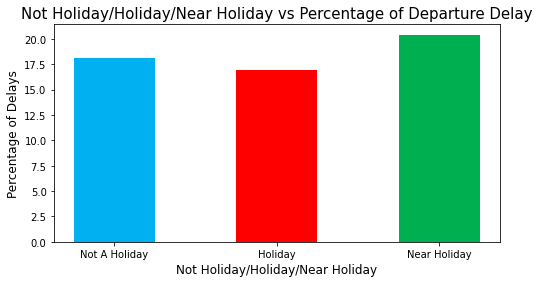

Text(0.5, 1.0, 'Not Holiday/Holiday/Near Holiday vs Percentage of Departure Delay')

In [0]:
fig = plt.figure(figsize = (8, 4))
color = ('lightblue', 'pink', 'mediumaquamarine')
categories = ('Not A Holiday', 'Holiday', 'Near Holiday')
y_pos = np.arange(len(categories))

plt.bar(holiday_delay['HOLIDAY'] , holiday_delay['Percentage_of_Delays'],  
            width = 0.5, label='Percentage_of_Delays', color=color)
plt.xlabel('Not Holiday/Holiday/Near Holiday', fontsize = 12)
plt.ylabel('Percentage of Delays', fontsize = 12)
plt.xticks(y_pos, categories)
plt.title('Not Holiday/Holiday/Near Holiday vs Percentage of Departure Delay', fontsize = 15)

### Previous Flight Delay Indicator?

For planes with the same tail numbers, we believe there is a relation between the previous flight delay time and the current flight delay. If a plane arrives at the airport closer to its next departure time, it is more likely that it will be unable to depart on time for its next flight. Therefore, we are also thinking to add in a new indicator to check if the previous flight was delayed.